# GE Bracket

Geometry from the GE jet engine bracket challenge: https://grabcad.com/challenges/ge-jet-engine-bracket-challenge

Load cases considered in the optimization: 35.6 kN vertical force / 37.8 kN horizontal force

For numerical reasons, the force was rescaled by a factor of 0.01. Therefore, to obtain the actual compliance it is necessary to multiply the output by 10000 and to obtain the actual displament it is necessary to multiply the output by 100.

Ansys model:
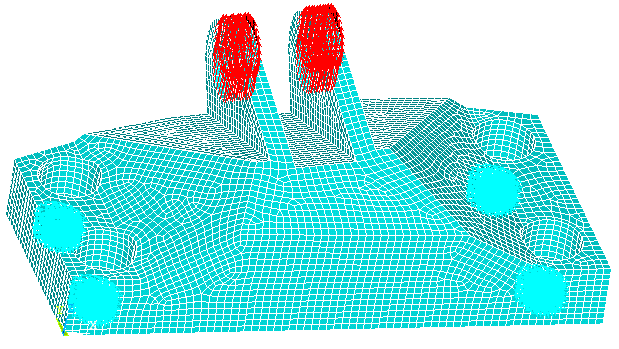

In [1]:
import os, sys
path = os.path.abspath(os.path.join('..'))
os.chdir(path)
if path not in sys.path:
    sys.path.append(path)

In [2]:
import matplotlib.pyplot as plt
import niceplots
plt.style.use(niceplots.get_style())

from optim import TopOpt, Post3D

In [3]:
# {t/mm^3, MPa, -, kgCO2/kg}
flax = {'rho': 1470e-12, 'E': 53.5e3, 'v': 0.355, 'CO2': 0.44}
pla  = {'rho': 1290e-12, 'E': 5.19e3, 'v': 0.39, 'CO2': 2.115}
Vfiber  = 0.5

Ex, Ey, nuxy, nuyz, Gxy, rho, CO2mat = TopOpt.rule_mixtures(fiber=flax, matrix=pla, Vfiber=Vfiber)
CO2veh = 1030 * 25 * 3.83 # kg_fuel/kg_transported/year * years * kgCO2/kg_fuel = kgCO2/kg

In [4]:
solver1 = TopOpt(inputfile='models/bracket.db', load_cases=('models/bracket_ver.s01','models/bracket_hor.s01'), res_dir='results/bracket/mult_free/',
        dim='3D_free', jobname='mult_free')
solver1.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver1.set_volfrac(0.3)
solver1.set_filters(r_rho=5, r_theta=7)
solver1.set_initial_conditions('random')
solver1.set_optim_options(max_iter=30, tol=5e-3, continuation=True)

solver1.run()
solver1.save()

solver1.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver1.get_max_disp(load_case=1)))
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver1.get_max_disp(load_case=2)))

PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
Iteration   0...  c_1 =    21.3139, c_2 =     4.5558
Iteration   1...  c_1 =    30.4081, c_2 =     7.6733
Iteration   2...  c_1 =    27.3919, c_2 =     7.2969
Iteration   3...  c_1 =    29.4422, c_2 =     9.2429
Iteration   4...  c_1 =    25.6679, c_2 =     7.5103
Iteration   5...  c_1 =    22.1302, c_2 =     6.7336
Iteration   6...  c_1 =    20.4084, c_2 =     6.6418
Iteration   7...  c_1 =    18.6260, c_2 =     6.2141
Iteration   8...  c_1 =    16.9595, c_2 =     5.8832
Iteration   9...  c_1 =    16.5520, c_2 =     6.0002
Iteration  10...  c_1 =    15.2720, c_2 =     5.5196
Iteration  11...  c_1 =    14.6652, c_2 =     5.3932
Iteration  12...  c_1 =    14.3796, c_2 =     5.4669
Iteration  13...  c_1 =    13.7893, c_2 =     5.1950
Iteration  14...  c_

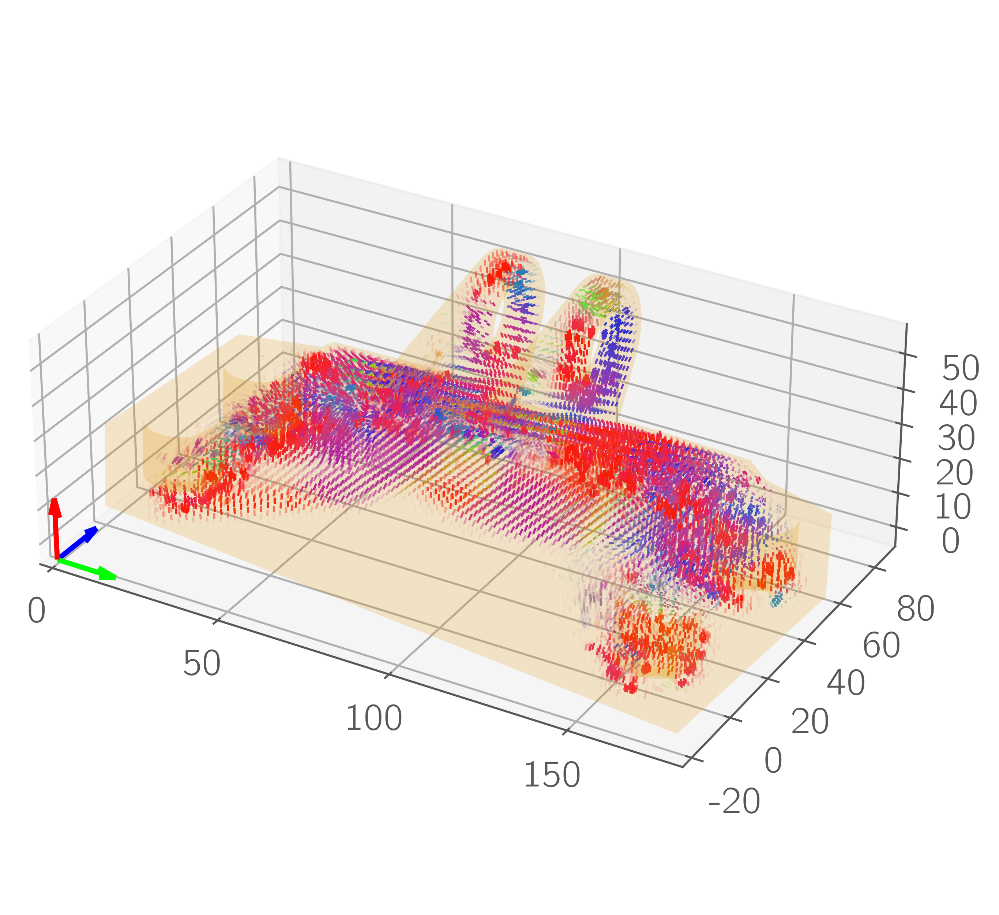

In [7]:
# solver1 = TopOpt.load('results/bracket/mult_free/topopt.json')
post1 = Post3D(solver1)
post1.plot(domain_stl='models/bracket.stl')

In [8]:
solver2 = TopOpt(inputfile='models/bracket.db', load_cases='models/bracket_ver.s01', res_dir='results/bracket/vert_free/',
        dim='3D_free', jobname='vert_free')
solver2.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver2.set_volfrac(0.3)
solver2.set_filters(r_rho=5, r_theta=7)
solver2.set_initial_conditions('random')
solver2.set_optim_options(max_iter=30, tol=5e-3, continuation=True)

solver2.run()
solver2.save()

solver2.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver2.get_max_disp()))

PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
Iteration   0...  c =    21.3548
Iteration   1...  c =    30.2413
Iteration   2...  c =    27.3914
Iteration   3...  c =    29.5331
Iteration   4...  c =    25.3442
Iteration   5...  c =    21.9672
Iteration   6...  c =    20.2199
Iteration   7...  c =    18.4260
Iteration   8...  c =    16.8150
Iteration   9...  c =    16.3826
Iteration  10...  c =    15.2353
Iteration  11...  c =    14.6601
Iteration  12...  c =    14.3238
Iteration  13...  c =    13.7666
Iteration  14...  c =    13.3645
Iteration  15...  c =    13.3092
Iteration  16...  c =    17.0170
Iteration  17...  c =    15.5423
Iteration  18...  c =    15.1149
Iteration  19...  c =    14.5760
Iteration  20...  c =    14.3220
Iteration  21...  c =    14.2174
Iteration  22...  c =    13.9787
Iteration  23...  c =    13.8834
Iteration  24...  c =    13.9084
Iteration  25...  c =    15.2204
Iteration  26...  c =  

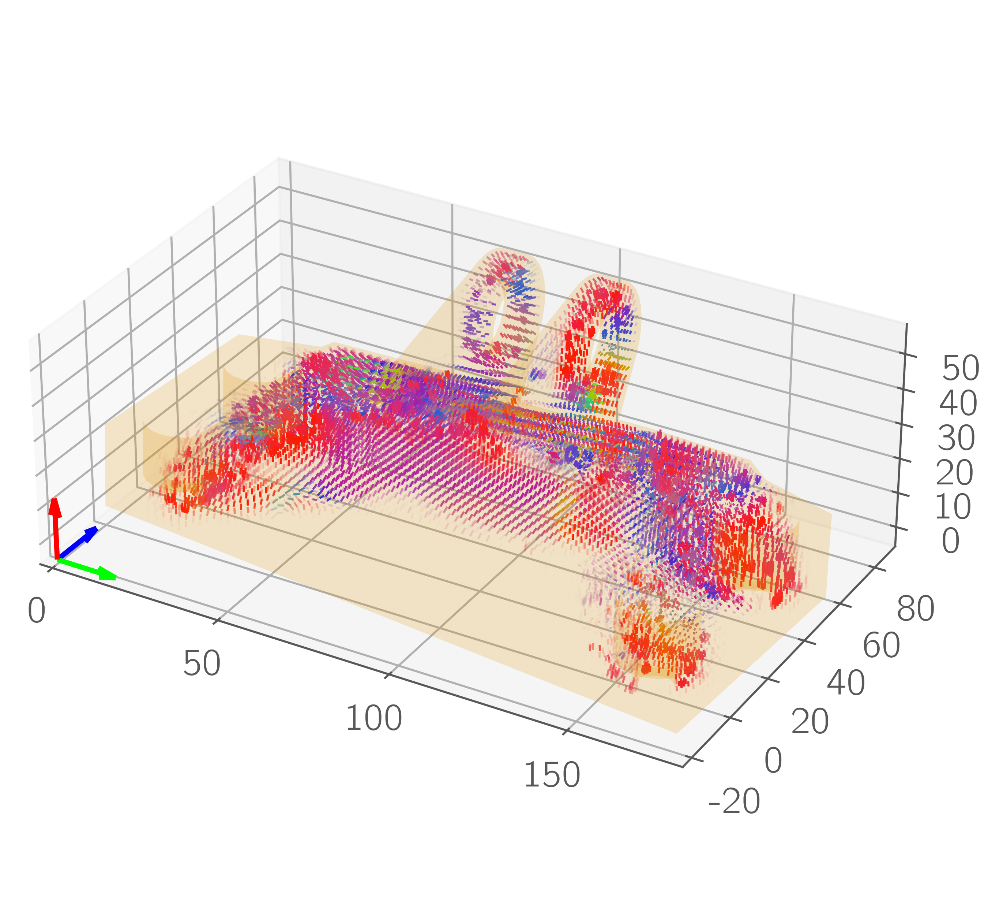

In [9]:
# solver2 = TopOpt.load('results/bracket/vert_free/topopt.json')
post2 = Post3D(solver2)
post2.plot(domain_stl='models/bracket.stl')

In [10]:
solver3 = TopOpt(inputfile='models/bracket.db', load_cases='models/bracket_hor.s01', res_dir='results/bracket/hor_free/',
        dim='3D_free', jobname='hor_free')
solver3.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver3.set_volfrac(0.3)
solver3.set_filters(r_rho=5, r_theta=7)
solver3.set_initial_conditions('random')
solver3.set_optim_options(max_iter=30, tol=5e-3, continuation=True)

solver3.run()
solver3.save()

solver3.print_timing()
print()
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver3.get_max_disp()))

PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
Iteration   0...  c =     4.5476
Iteration   1...  c =     7.4602
Iteration   2...  c =     6.1279
Iteration   3...  c =     6.1866
Iteration   4...  c =     5.2698
Iteration   5...  c =     4.3849
Iteration   6...  c =     4.2218
Iteration   7...  c =     3.6442
Iteration   8...  c =     3.3949
Iteration   9...  c =     3.2534
Iteration  10...  c =     3.0300
Iteration  11...  c =     2.8754
Iteration  12...  c =     2.8427
Iteration  13...  c =     2.7059
Iteration  14...  c =     2.6444
Iteration  15...  c =     2.6306
Iteration  16...  c =     2.5722
Iteration  17...  c =     2.5494
Iteration  18...  c =     2.5557
Iteration  19...  c =     3.3047
Iteration  20...  c =     3.0550
Iteration  21...  c =     3.0008
Iteration  22...  c =     2.9378
Iteration  23...  c =     2.9146
Iteration  24...  c =     2.9206
Iteration  25...  c =     3.3796
Iteration  26...  c =  

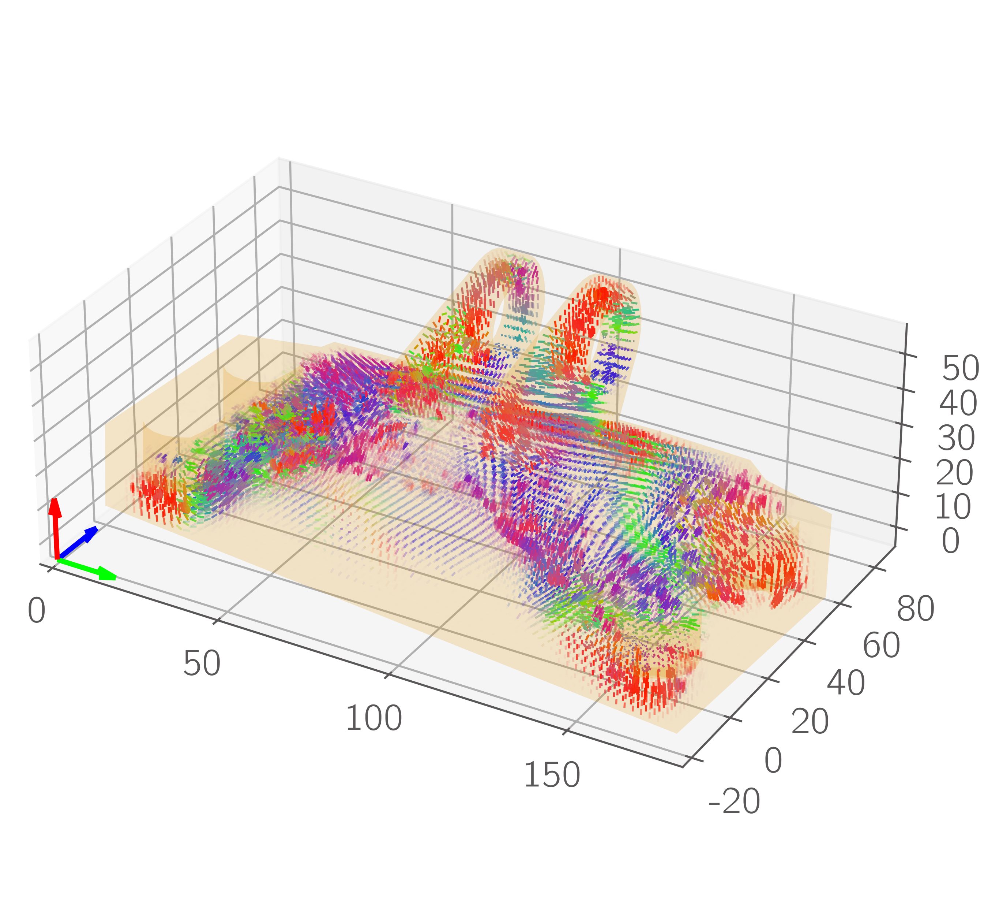

In [11]:
# solver3 = TopOpt.load('results/bracket/hor_free/topopt.json')
post3 = Post3D(solver3)
post3.plot(domain_stl='models/bracket.stl')

In [12]:
solver4 = TopOpt(inputfile='models/bracket.db', load_cases=('models/bracket_ver.s01','models/bracket_hor.s01'), res_dir='results/bracket/mult_layer/',
        dim='3D_layer', jobname='mult_layer')
solver4.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver4.set_volfrac(0.3)
solver4.set_filters(r_rho=5, r_theta=7)
solver4.set_initial_conditions('random')
solver4.set_optim_options(max_iter=30, tol=5e-3, continuation=True)

solver4.run()
solver4.save()

solver4.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver4.get_max_disp(load_case=1)))
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver4.get_max_disp(load_case=2)))

PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
Iteration   0...  c_1 =    21.1963, c_2 =     4.5657
Iteration   1...  c_1 =    26.3482, c_2 =     6.8674
Iteration   2...  c_1 =    22.4783, c_2 =     6.0546
Iteration   3...  c_1 =    19.8694, c_2 =     5.5832
Iteration   4...  c_1 =    16.6200, c_2 =     4.7607
Iteration   5...  c_1 =    14.2741, c_2 =     4.3791
Iteration   6...  c_1 =    13.1153, c_2 =     4.2307
Iteration   7...  c_1 =    12.3035, c_2 =     4.1424
Iteration   8...  c_1 =    11.7397, c_2 =     4.0004
Iteration   9...  c_1 =    11.4889, c_2 =     4.0840
Iteration  10...  c_1 =    11.1863, c_2 =     3.9866
Iteration  11...  c_1 =    10.9481, c_2 =     3.9864
Iteration  12...  c_1 =    10.8449, c_2 =     4.0411
Iteration  13...  c_1 =    10.6636, c_2 =     4.0160
Iteration  14...  c_1 =    10.5782, c_2 =     4.0273
Iteration  15...  c_1 =    10.5751, c_2 =     4.0708
Iteration  16...  c_1 =    12.736

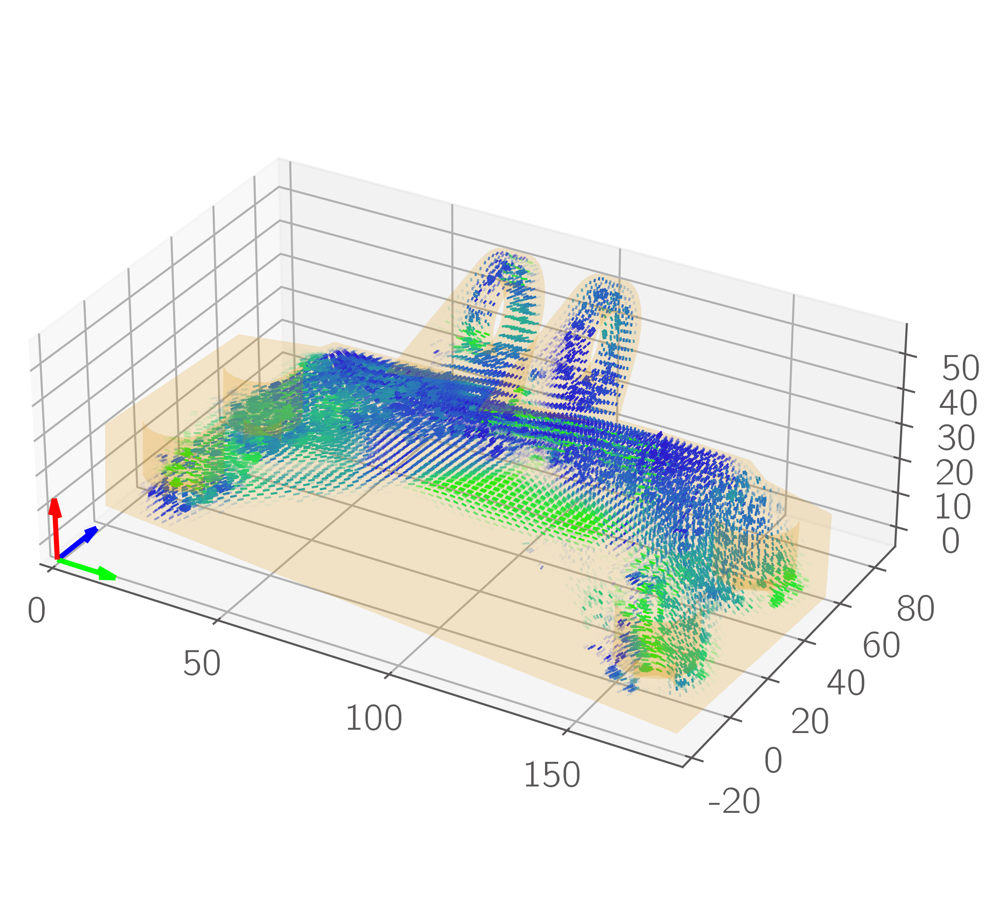

In [13]:
# solver4 = TopOpt.load('results/bracket/mult_layer/topopt.json')
post4 = Post3D(solver4)
post4.plot(domain_stl='models/bracket.stl')

In [14]:
solver5 = TopOpt(inputfile='models/bracket.db', load_cases='models/bracket_ver.s01', res_dir='results/bracket/vert_layer/',
        dim='3D_layer', jobname='vert_layer')
solver5.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver5.set_volfrac(0.3)
solver5.set_filters(r_rho=5, r_theta=7)
solver5.set_initial_conditions('random')
solver5.set_optim_options(max_iter=30, tol=5e-3, continuation=True)

solver5.run()
solver5.save()

solver5.print_timing()
print()
print('Maximum displacement - vertical force: {:.2f} mm'.format(100 * solver5.get_max_disp()))

PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
Iteration   0...  c =    21.2277
Iteration   1...  c =    26.3142
Iteration   2...  c =    22.5292
Iteration   3...  c =    20.0223
Iteration   4...  c =    16.6016
Iteration   5...  c =    14.3559
Iteration   6...  c =    13.2624
Iteration   7...  c =    12.4145
Iteration   8...  c =    11.8630
Iteration   9...  c =    11.5022
Iteration  10...  c =    11.1351
Iteration  11...  c =    10.8686
Iteration  12...  c =    10.7760
Iteration  13...  c =    10.6028
Iteration  14...  c =    10.5459
Iteration  15...  c =    10.5694
Iteration  16...  c =    12.7355
Iteration  17...  c =    12.1092
Iteration  18...  c =    11.9534
Iteration  19...  c =    11.8412
Iteration  20...  c =    11.8189
Iteration  21...  c =    13.0193
Iteration  22...  c =    12.2970
Iteration  23...  c =    12.1214
Iteration  24...  c =    12.0716
Iteration  25...  c =    12.5225
Iteration  26...  c =  

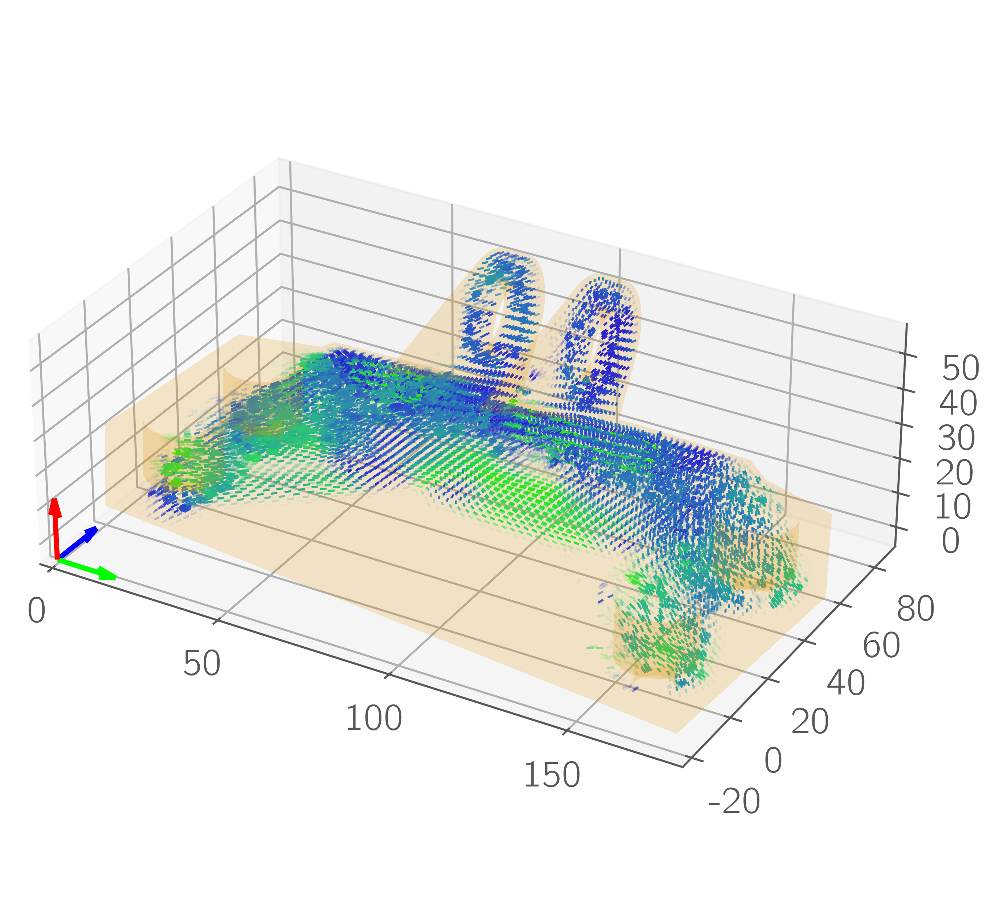

In [15]:
# solver5 = TopOpt.load('results/bracket/vert_layer/topopt.json')
post5 = Post3D(solver5)
post5.plot(domain_stl='models/bracket.stl')

In [16]:
solver6 = TopOpt(inputfile='models/bracket.db', load_cases='models/bracket_hor.s01', res_dir='results/bracket/hor_layer/',
         dim='3D_layer', jobname='hor_layer')
solver6.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
solver6.set_volfrac(0.3)
solver6.set_filters(r_rho=5, r_theta=7)
solver6.set_initial_conditions('random')
solver6.set_optim_options(max_iter=30, tol=5e-3, continuation=True)

solver6.run()
solver6.save()

solver6.print_timing()
print()
print('Maximum displacement - horizontal force: {:.2f} mm'.format(100 * solver6.get_max_disp()))

PyMAPDL is taking longer than expected to connect to an MAPDL session.
Checking if there are any available licenses...
Iteration   0...  c =     4.5705
Iteration   1...  c =     6.5801
Iteration   2...  c =     5.0932
Iteration   3...  c =     4.1574
Iteration   4...  c =     3.4593
Iteration   5...  c =     2.9480
Iteration   6...  c =     2.7512
Iteration   7...  c =     2.5989
Iteration   8...  c =     2.5075
Iteration   9...  c =     2.4795
Iteration  10...  c =     2.4084
Iteration  11...  c =     2.3700
Iteration  12...  c =     2.3724
Iteration  13...  c =     3.0787
Iteration  14...  c =     2.9410
Iteration  15...  c =     2.8988
Iteration  16...  c =     2.8483
Iteration  17...  c =     2.8275
Iteration  18...  c =     2.8123
Iteration  19...  c =     2.7677
Iteration  20...  c =     2.7133
Iteration  21...  c =     2.7075
Iteration  22...  c =     3.0665
Iteration  23...  c =     2.9300
Iteration  24...  c =     2.8955
Iteration  25...  c =     2.8464
Iteration  26...  c =  

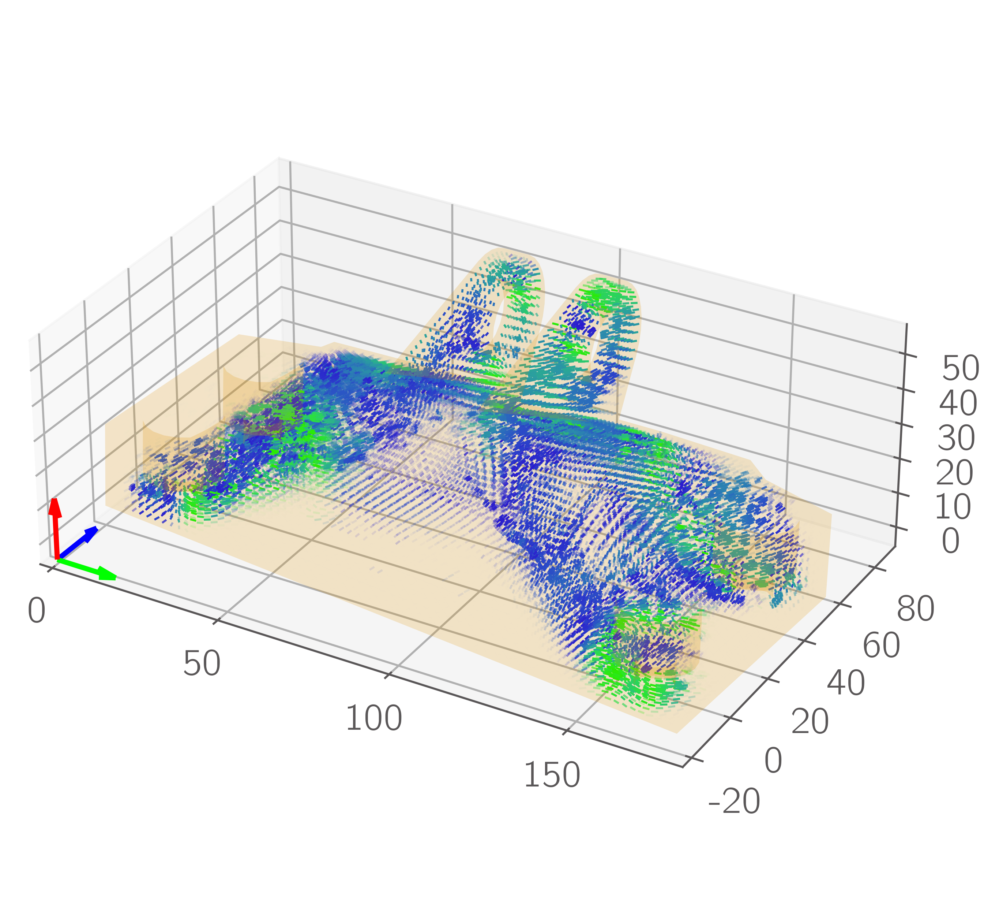

In [17]:
# solver6 = TopOpt.load('results/bracket/hor_layer/topopt.json')
post6 = Post3D(solver6)
post6.plot(domain_stl='models/bracket.stl')

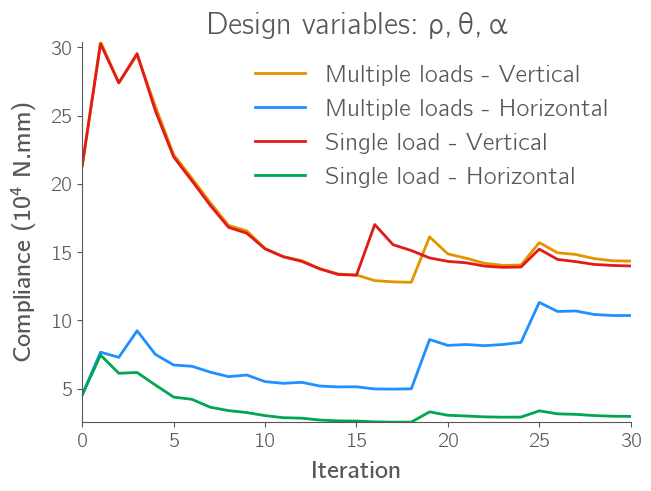

In [18]:
plt.figure()
plt.plot(solver1.comp_hist[0], label='Multiple loads - Vertical')
plt.plot(solver1.comp_hist[1], label='Multiple loads - Horizontal')
plt.plot(solver2.comp_hist[0], label='Single load - Vertical')
plt.plot(solver3.comp_hist[0], label='Single load - Horizontal')
plt.ylabel(r'Compliance ($10^4$ N.mm)')
plt.xlabel('Iteration')
plt.title(r'Design variables: $\rho, \theta, \alpha$')
plt.legend()

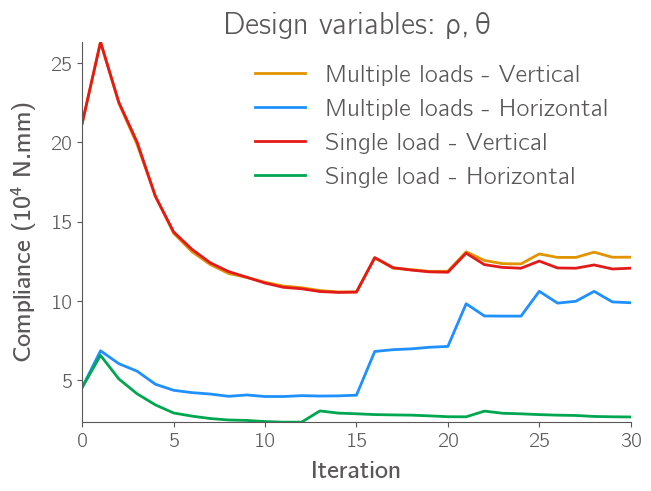

In [19]:
plt.figure()
plt.plot(solver4.comp_hist[0], label='Multiple loads - Vertical')
plt.plot(solver4.comp_hist[1], label='Multiple loads - Horizontal')
plt.plot(solver5.comp_hist[0], label='Single load - Vertical')
plt.plot(solver6.comp_hist[0], label='Single load - Horizontal')
plt.ylabel(r'Compliance ($10^4$ N.mm)')
plt.xlabel('Iteration')
plt.title(r'Design variables: $\rho, \theta$')
plt.legend()

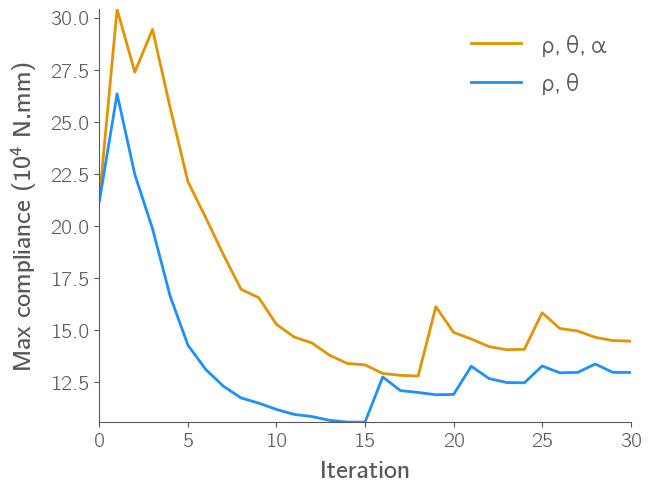

In [20]:
plt.figure()
plt.plot(solver1.comp_max_hist, label=r'$\rho, \theta, \alpha$')
plt.plot(solver4.comp_max_hist, label=r'$\rho, \theta$')
plt.ylabel(r'Max compliance ($10^4$ N.mm)')
plt.xlabel('Iteration')
plt.legend()

In [ ]:
# get final solver2 compliance for horizontal force
eval1 = TopOpt(inputfile='models/bracket.db', locad_cases='bracket_hor.s01', res_dir='results/bracket/ver_free2/',
    dim='3D_free', jobname='ver_free2', echo=False)
eval1.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp2_hor = eval1.fea(solver2.current_state['x'].copy())

# get final solver3 compliance for vertical force
eval2 = TopOpt(inputfile='models/bracket.db', locad_cases='bracket_ver.s01', res_dir='results/bracket/hor_free2/',
    dim='3D_free', jobname='hor_free2', echo=False)
eval2.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp3_ver = eval2.fea(solver3.current_state['x'].copy())

# get final solver5 compliance for horizontal force
eval3 = TopOpt(inputfile='models/bracket.db', locad_cases='bracket_hor.s01', res_dir='results/bracket/ver_layer2/',
    dim='3D_layer', jobname='ver_layer2', echo=False)
eval3.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp5_hor = eval3.fea(solver5.current_state['x'].copy())

# get final solver6 compliance for vertical force
eval4 = TopOpt(inputfile='models/bracket.db', locad_cases='bracket_ver.s01', res_dir='results/bracket/hor_layer2/',
    dim='3D_layer', jobname='hor_layer2', echo=False)
eval4.set_material(Ex=Ex, Ey=Ey, nuxy=nuxy, nuyz=nuxy, Gxy=Gxy)
comp6_ver = eval4.fea(solver6.current_state['x'].copy())

In [24]:
print('Final compliance (10^4 N.mm) - rho, theta, alpha')
print('-'*(18*3+4))
print('|{:^18}|{:^18}|{:^18}|'.format('Optim load cases','c1','c2'))
print('-'*(18*3+4))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Both',solver1.comp_hist[0][-1],solver1.comp_hist[1][-1]))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Vertical only',solver2.comp_hist[0][-1],comp2_hor))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Horizontal only',comp3_ver,solver3.comp_hist[0][-1]))
print('-'*(18*3+4))

print()

print('Final compliance (10^4 N.mm) - rho, theta')
print('-'*(18*3+4))
print('|{:^18}|{:^18}|{:^18}|'.format('Optim load cases','c1','c2'))
print('-'*(18*3+4))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Both',solver4.comp_hist[0][-1],solver4.comp_hist[1][-1]))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Vertical only',solver5.comp_hist[0][-1],comp5_hor))
print('|{:^18}|{:^18.3f}|{:^18.3f}|'.format('Horizontal only',comp6_ver,solver6.comp_hist[0][-1]))
print('-'*(18*3+4))

Final compliance (10^4 N.mm) - rho, theta, alpha
----------------------------------------------------------
| Optim load cases |        c1        |        c2        |
----------------------------------------------------------
|       Both       |      14.342      |      10.357      |
|  Vertical only   |      13.983      |      15.356      |
| Horizontal only  |     152.662      |      2.973       |
----------------------------------------------------------

Final compliance (10^4 N.mm) - rho, theta
----------------------------------------------------------
| Optim load cases |        c1        |        c2        |
----------------------------------------------------------
|       Both       |      12.767      |      9.896       |
|  Vertical only   |      12.073      |      12.073      |
| Horizontal only  |     114.689      |      2.697       |
----------------------------------------------------------
